In [1]:
import numpy as np
import pandas as pd
import scipy.io
import os,re

import matplotlib.pyplot as plt

plt.jet()

%matplotlib inline

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


<Figure size 640x480 with 0 Axes>

In [2]:
dataFolder = '/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents'

#read SA data
dfSA = pd.read_excel(dataFolder+'/2.4 Utilities/03. Utilities Distribution/utility_mapping_M1B_labels-16-Feb-2023.xlsx')
sax = np.array(dfSA['x_m']) #in M1B
say = np.array(dfSA['y_m'])
saz = np.array(dfSA['z_m'])
saID = np.array(dfSA['LSNo'])
saReqMaxFx_N = np.array(dfSA['ReqMaxFx_N']) #max Fx the SA is allowed to produce??
print('N actuators = ', len(dfSA))

#read Afz (Fz influence matrix)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/OA_influence_matrices_all/Afz-whp-09-Aug-2023.csv', header=None)
Afz = np.array(df)
print('Afz = ',Afz.shape)
# this is Afz only; it is 27685 x 170.

#read Afx (Fx influence matrix)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/OA_influence_matrices_all/Afx-whp-09-Aug-2023.csv', header=None)
Afx = np.array(df)
print('Afx = ', Afx.shape)

#read Afy (Fy influence matrix)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/OA_influence_matrices_all/Afy-whp-09-Aug-2023.csv', header=None)
Afy = np.array(df)
print('Afy = ', Afy.shape)

#read FEA nodes data
mat = scipy.io.loadmat(dataFolder+'/influnce_matrix_files/NodeXYZsurface_meters.mat')
nodeID = mat['NodeXYZsurface_meters'][:,0]
nodex = mat['NodeXYZsurface_meters'][:,2] #swap x/y to get to M1B
nodey = mat['NodeXYZsurface_meters'][:,1]
nodez = mat['NodeXYZsurface_meters'][:,3]
print('N node = ', len(nodeID))

#read Af (where hp forces are along the hps)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/OA_influence_matrices_all/Af_hp-07-Sep-2023.csv', header=None)
Afhp = np.array(df)
print('Afhp = ', Afhp.shape)

N actuators =  170
Afz =  (27685, 176)
Afx =  (27685, 176)
Afy =  (27685, 176)
N node =  27685
Afhp =  (27685, 6)


In [3]:
#these files are probably not needed, but let's check what is in there.
df = pd.read_csv(dataFolder+'/influnce_matrix_files/OA_influence_matrices_all/V_hp-07-Sep-2023.csv', header=None)
Vhp = np.array(df)
print('Vhp = ', Vhp.shape)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/OA_influence_matrices_all/U_hp-07-Sep-2023.csv', header=None)
Uhp = np.array(df)
print('Vhp = ', Uhp.shape)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/OA_influence_matrices_all/S_hp-07-Sep-2023.csv', header=None)
Shp = np.array(df)
print('Vhp = ', Shp.shape)

Vhp =  (6, 6)
Vhp =  (27685, 6)
Vhp =  (6, 6)


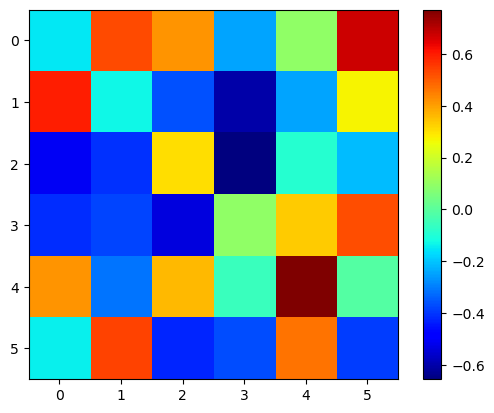

In [4]:
plt.imshow(Vhp) #we will not use these forces to bend the mirror
plt.colorbar();

In [5]:
nact = len(dfSA)

In [6]:
df = np.loadtxt('HP_xy.txt') #from Trupti email, in M1B
hpx = df[:,0]
hpy = df[:,1]

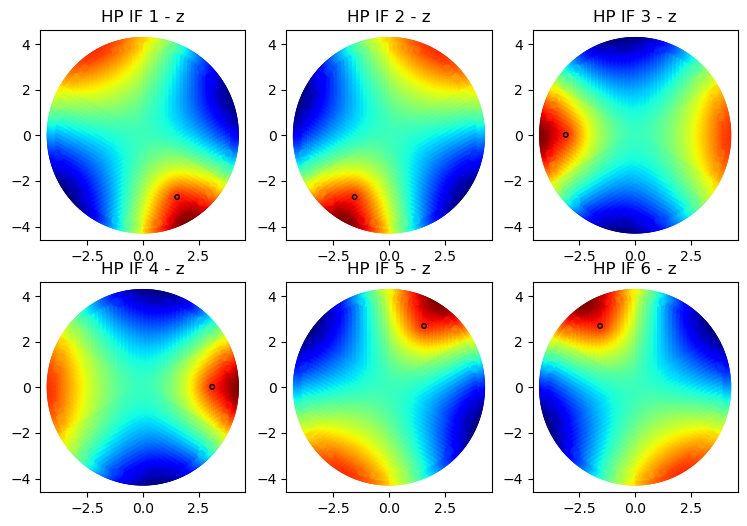

In [7]:
nrow = 2
fig, ax = plt.subplots(nrow,3,figsize=(9,3*nrow))
i = 0
for HPID in range(1,3*nrow+1):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, Afz[:,HPID-1+nact])
    circle = plt.Circle((hpx[HPID-1], hpy[HPID-1]),0.1, fill=False)
    ax[irow][icol].add_artist(circle)
    ax[irow][icol].set_title('HP IF %d - z'%HPID)

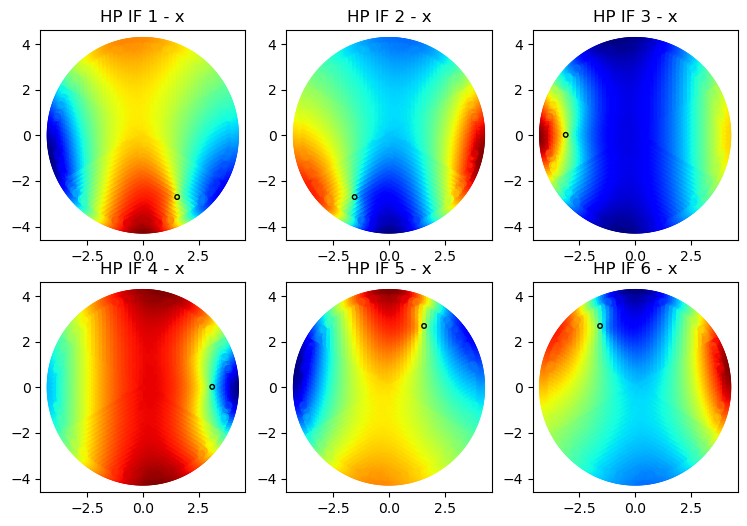

In [8]:
nrow = 2
fig, ax = plt.subplots(nrow,3,figsize=(9,3*nrow))
i = 0
for HPID in range(1,3*nrow+1):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, Afx[:,HPID-1+nact])
    circle = plt.Circle((hpx[HPID-1], hpy[HPID-1]),0.1, fill=False)
    ax[irow][icol].add_artist(circle)
    ax[irow][icol].set_title('HP IF %d - x'%HPID)

(-4.599069034, 4.599063954, -4.599119326, 4.599114246)

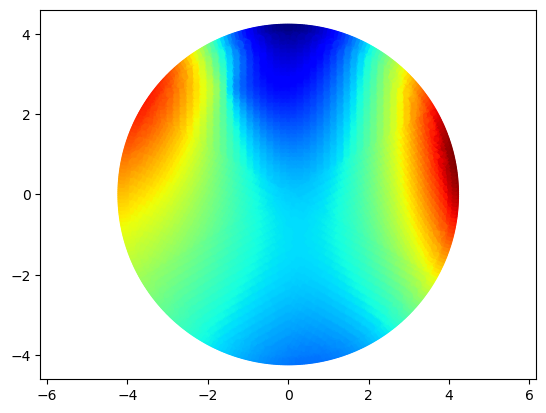

In [9]:
plt.scatter(nodex, nodey, 10, Afx[:,175])
plt.axis('equal')

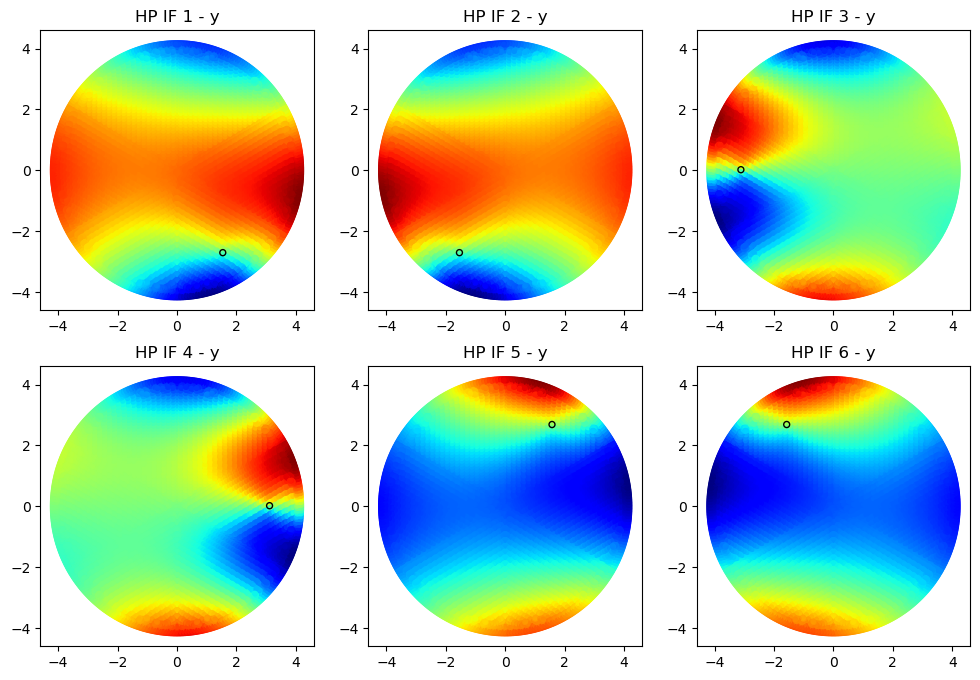

In [10]:
nrow = 2
fig, ax = plt.subplots(nrow,3,figsize=(9,3*nrow))
i = 0
for HPID in range(1,3*nrow+1):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, Afy[:,HPID-1+nact])
    circle = plt.Circle((hpx[HPID-1], hpy[HPID-1]),0.1, fill=False)
    ax[irow][icol].add_artist(circle)
    ax[irow][icol].set_title('HP IF %d - y'%HPID)

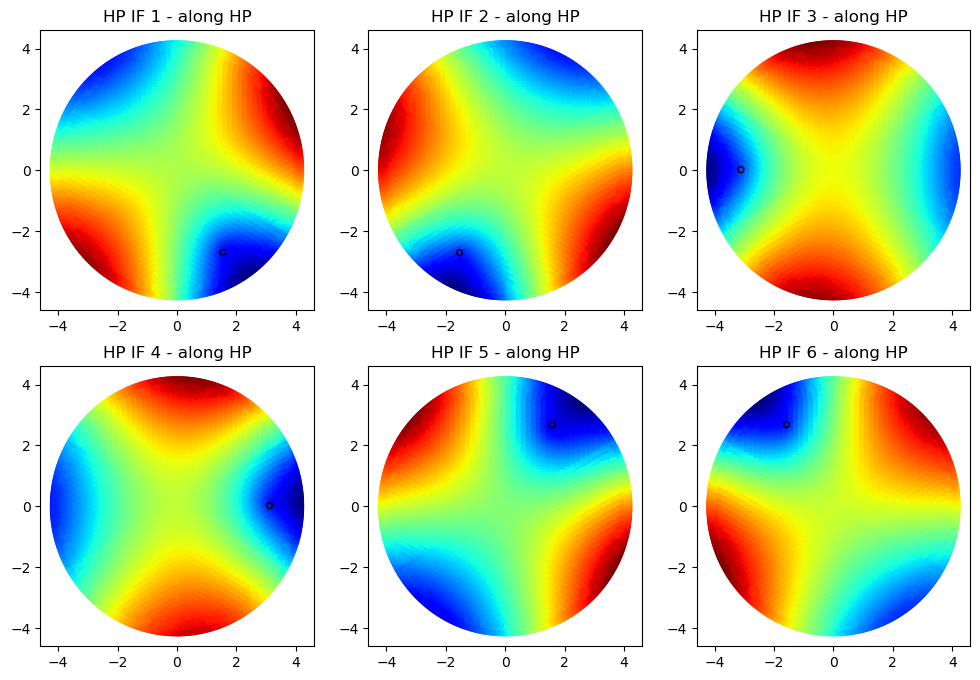

In [11]:
nrow = 2
fig, ax = plt.subplots(nrow,3,figsize=(9,3*nrow))
i = 0
for HPID in range(1,3*nrow+1):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    i += 1

    img = ax[irow][icol].scatter(nodex, nodey,10, Afhp[:,HPID-1])
    circle = plt.Circle((hpx[HPID-1], hpy[HPID-1]),0.1, fill=False)
    ax[irow][icol].add_artist(circle)
    ax[irow][icol].set_title('HP IF %d - along HP'%HPID)

### For the z forces, what would be the force set that produces these shapes?

The forward multiplication S = influenceMat*[0 0 1 0 ... 0] filtered out the piston, tilt, etc. Can we predict the balanced forces that would produce S? does it agree with the K matrix?

(-4.599069034, 4.599063954, -4.599119326, 4.599114246)

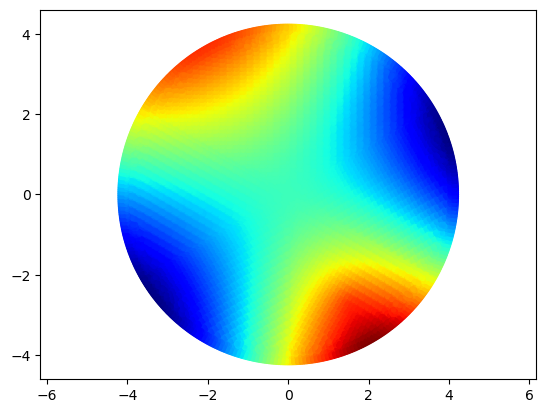

In [12]:
HPID = 0
plt.scatter(nodex, nodey, 10, Afz[:, nact+HPID])
plt.axis('equal')

In [13]:
colList = list(range(nact))
colList.append(nact+HPID)
print(colList)
myAfz = Afz[:, colList]
print(myAfz.shape)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170]
(27685, 171)


In [14]:
myF = np.linalg.pinv(myAfz)@Afz[:,nact+HPID]

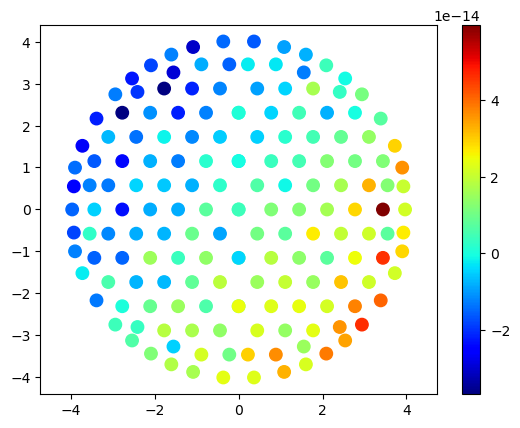

In [15]:
plt.scatter(sax, say, 80, myF[:nact])
plt.axis('equal')
plt.colorbar()

In [16]:
print(myF[nact+HPID])

1.0000000000000204


In [17]:
sum(myF)

1.0000000000008407

too good. Let's do our own matrix inversion.

In [18]:
U, S, Vh = np.linalg.svd(myAfz)

In [19]:
V = Vh.transpose()
len(S)

171

In [20]:
Sinv = np.zeros((len(S), len(S)))
for i in range(len(S)):
    Sinv[i,i] = 1./S[i]

5


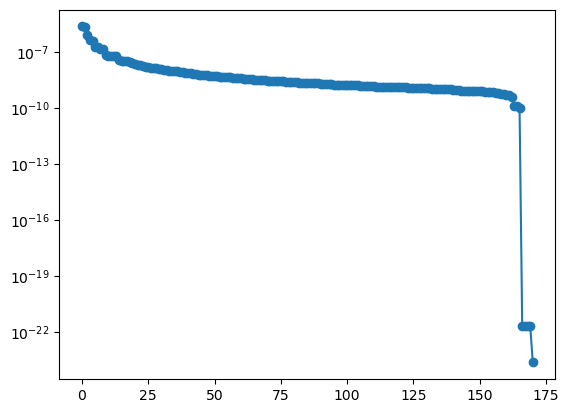

In [21]:
plt.semilogy(S, '-o')
print(sum(S<1e-12))

5


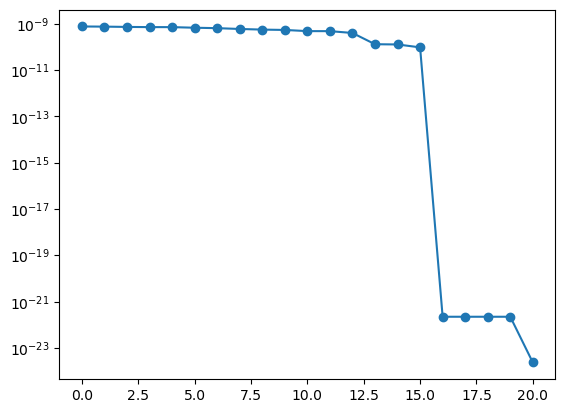

In [22]:
plt.semilogy(S[150:], '-o')
print(sum(S<1e-12))

In [23]:
nrow = 36
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))
i = 0
for modeID in range(1,5*nrow+1):
    if modeID <= nact+1:
        irow = np.int8(i/5)
        icol = np.mod(i,5)
        i += 1

        img = ax[irow][icol].scatter(sax, say,80, V[:-1,modeID-1])
        ax[irow][icol].set_title('X bending mode %d, Sum = %.1fN'%(modeID, np.sum(V[:,modeID-1])))

In [24]:
Sinv[nact+1-3:, nact+1-3:] = 0
print(Sinv[nact+1-3:, nact+1-3:].shape)

In [ ]:
myF1 = Vh.transpose()@ Sinv@ U[:,:(nact+1)].transpose() @Afz[:,nact+0]

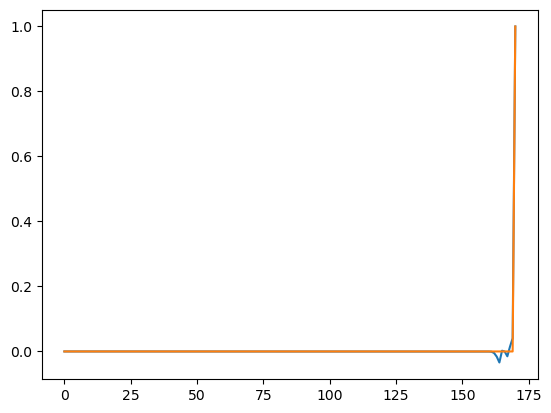

In [26]:
plt.plot(myF1)
plt.plot(myF)

In [27]:
sum(myF1)

0.9865875244160223

In [28]:
Sinv[nact-6:, nact-6:].shape

(7, 7)

something is not quite right. The last a few V vectors - should I expect them to be piston, tip, and tilt? but they are not. Maybe there is something I don't understand about the SVD in numpy.

### Let's do a forward prediction using the K-matrix, and predict the HP IFs in two ways (1) Afz and (2) K-matrix, and see if they agree.

In [29]:
ctrlFolder = '/Users/bxin/gmt_local/modules/ocs_m1_dcs/src/etc/conf/m1_ctrl_pkg/m1_support_ctrl/'
FB_K_file = 'm1_force_distribution_matrix_conf.coffee'
filename = os.path.join(ctrlFolder, FB_K_file)

fid = open(filename)
KMat = np.zeros((170*3, 6))
i = 0
for line in fid:
    if len(line)>50:
        a = re.split('\[|]|,',line)
        a = [x for x in a if (x and not x.isspace() and x!='\n')]
        KMat[i,:] = a
        i += 1

In [30]:
KMat.shape

(510, 6)

In [31]:
netFM = np.zeros(6)
if HPID == 0:
    netFM[2] = 1 #Fz
    netFM[3] = 1*hpy[HPID]#Rx
    netFM[4] = -1*hpx[HPID] #Ry

In [32]:
myFF = KMat @ netFM

In [33]:
myFF.shape

(510,)

In [34]:
myFFx = np.array([myFF[3*i] for i in range(170)])
myFFy = np.array([myFF[3*i+1] for i in range(170)])
myFFz = np.array([myFF[3*i+2] for i in range(170)])

-0.9999960444529645


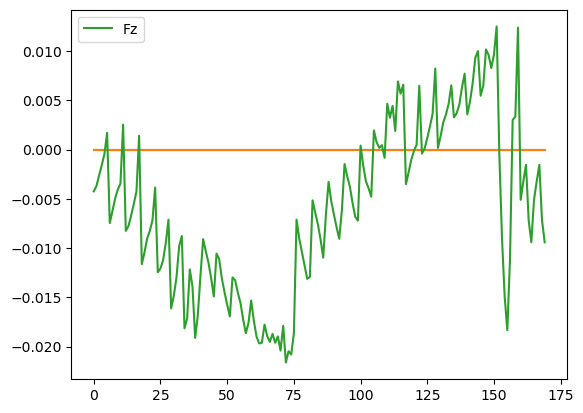

In [35]:
plt.plot(myFFx)
plt.plot(myFFy)
plt.plot(myFFz,label='Fz')
plt.legend();
print(sum(myFFz))

impact of all the balance forces

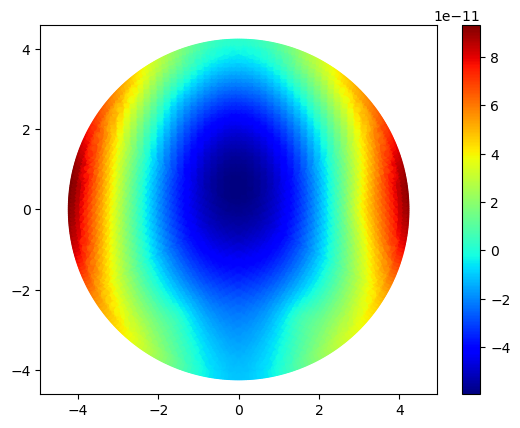

In [36]:
HPID = 0
plt.scatter(nodex, nodey, 10, Afz[:,:nact]@myFFz)
plt.axis('equal')
plt.colorbar()

Balance forces together with the "poke" by the single HP

In [37]:
mySS = Afz[:, colList] @ np.append(myFFz,1)

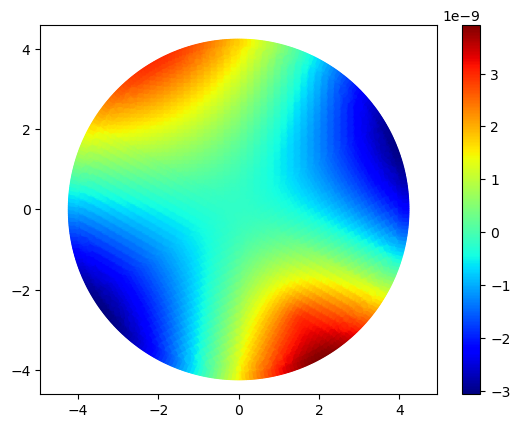

In [38]:
HPID = 0
plt.scatter(nodex, nodey, 10, mySS)
plt.axis('equal')
plt.colorbar()

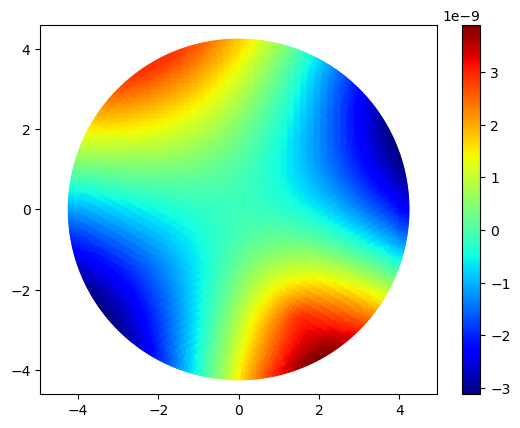

In [39]:
HPID = 0
plt.scatter(nodex, nodey, 10, Afz[:, nact+HPID]) #replot what we had with inf*[00100...0]
plt.axis('equal')
plt.colorbar();

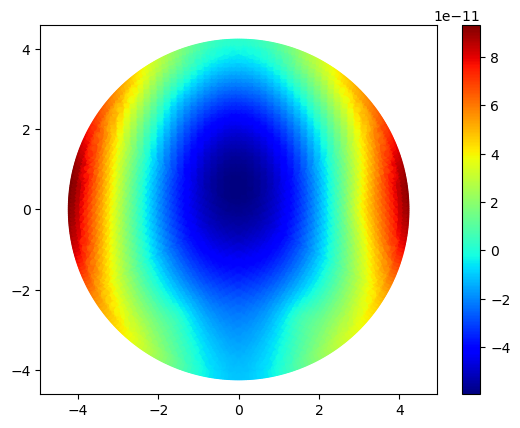

In [40]:
HPID = 0
plt.scatter(nodex, nodey, 10, mySS - Afz[:, nact+HPID])
plt.axis('equal')
plt.colorbar()